## Imports and cloning from Github

In [1]:
import os
import tensorflow as tf

os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ['CUDA_VISIBLE_DEVICES'] = "0"
gpus = tf.config.experimental.list_physical_devices("GPU")
print(gpus)
if len(gpus) > 0:
    tf.config.experimental.set_memory_growth(gpus[0], True)
else:  print('working on CPU')

import librosa
# !pip install python_speech_features
# from python_speech_features import mfcc, logfbank
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.io import wavfile


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [44]:
!git clone https://github.com/Code-Maker74/Keyword_Spotting.git

Cloning into 'Keyword_Spotting'...
remote: Enumerating objects: 54, done.
remote: Counting objects: 100% (54/54), done.
remote: Compressing objects: 100% (52/52), done.
remote: Total 54 (delta 25), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (54/54), done.


In [45]:
from Keyword_Spotting.numpy_visualisations import *
from Keyword_Spotting.preprocessing import *
from Keyword_Spotting.load_model import *

In [46]:
from glob import glob
base = '/content/drive/MyDrive/PodCastle/keywords2'
audios = [x for x in glob(base + '/*/*') if 'MACOSX' not in x] 
len(audios)

6036

In [47]:
from sklearn.model_selection import train_test_split as split 
train_files, val_files = split(np.array(audios), test_size = .1, random_state = 42)
train_files, test_files = split(train_files, test_size = .1, random_state = 42)
len(train_files), len(val_files), len(test_files), len(audios)

(4888, 604, 544, 6036)

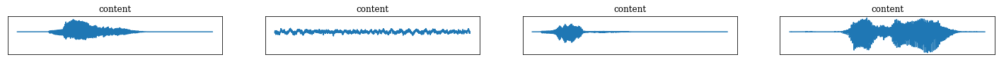

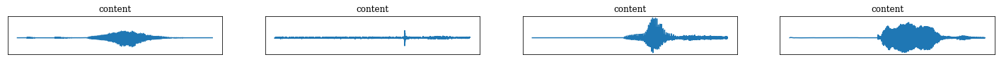

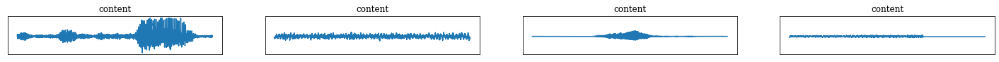

In [50]:
for i in range(3):
  plot_signals(audios, i)

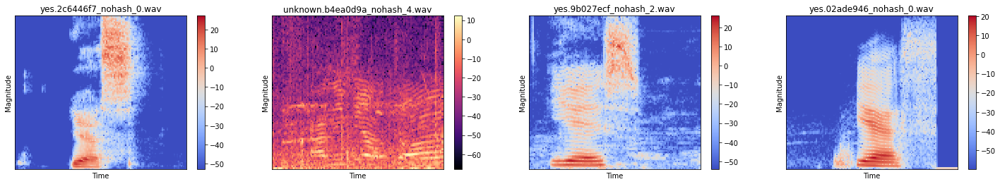

In [51]:
plot_log_spectograms(audios)

In [54]:
target = '/content/drive/MyDrive/PodCastle/keywords2/yes/yes.0a196374_nohash_4.wav'  # just a sample
waveform, label = get_waveform_and_label(target)
spectrogram = get_spectrogram(waveform)
spectrogram.shape

TensorShape([129, 124])

log spec shape: (129, 124)


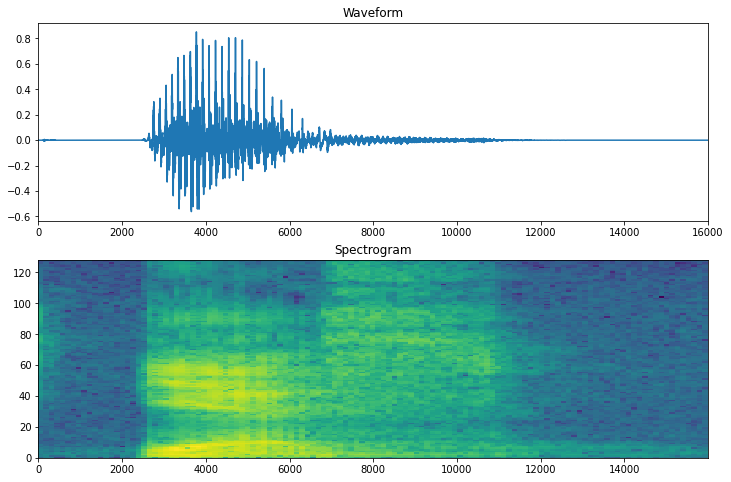

In [55]:
fig, axes = plt.subplots(2, figsize=(12, 8))
timescale = np.arange(waveform.shape[0])
axes[0].plot(timescale, waveform)
axes[0].set_title('Waveform')
axes[0].set_xlim([0, 16000])
plot_spectrogram(spectrogram.numpy(), axes[1])
axes[1].set_title('Spectrogram')
plt.show()

In [56]:
print('Label:', label.numpy().decode('utf-8'))
print('Waveform shape:', waveform.shape)
print('Spectrogram shape:', spectrogram.shape)
print('Audio playback')
from IPython import display
display.display(display.Audio(waveform, rate=16000))

Label: yes
Waveform shape: (16000,)
Spectrogram shape: (129, 124)
Audio playback


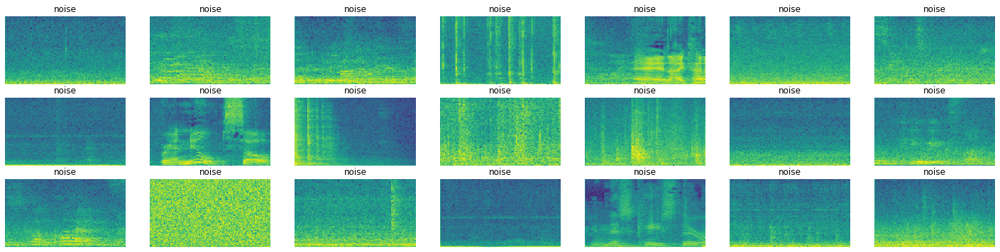

In [73]:
visualise_spectogram_data(3,7, audios)

In [76]:
train_ds = preprocess_dataset(train_files)
val_ds = preprocess_dataset(val_files)
test_ds = preprocess_dataset(test_files)

In [44]:
val_audio = []
val_labels = []
from tqdm import tqdm
for audio, label in tqdm(val_ds):
  val_audio.append(audio.numpy())
  val_labels.append(label.numpy())

val_audio = np.array(val_audio)
val_labels = np.array(val_labels)

100%|██████████| 604/604 [00:02<00:00, 299.95it/s]


In [45]:
test_audio = []
test_labels = []

from tqdm import tqdm
for audio, label in tqdm(test_ds):
  test_audio.append(audio.numpy())
  test_labels.append(label.numpy())

test_audio = np.array(test_audio)
test_labels = np.array(test_labels)

100%|██████████| 544/544 [00:01<00:00, 290.78it/s]


In [77]:
batch_size = 64
#train_ds = train_ds.shuffle(1024, reshuffle_each_iteration=True)
train_d = train_ds.batch(batch_size)
#train_ds = train_ds.repeat()
val_d = val_ds.batch(batch_size)

train_d = train_d.cache().prefetch(AUTOTUNE)
val_d = val_d.cache().prefetch(AUTOTUNE)

In [78]:
labels = ['no' , 'noise', 'unknown', 'yes']
for spectrogram, _ in train_ds.take(1):
  input_shape = spectrogram.shape
print('Input shape:', input_shape)
num_labels = len(labels)

Input shape: (129, 124, 1)


# Model building

In [179]:
from tensorflow.keras.layers import Dense, Conv2D, GlobalAveragePooling2D, MaxPooling2D, BatchNormalization, Dropout, Flatten, ReLU, Lambda, UpSampling2D, Conv2DTranspose
model = tf.keras.models.Sequential([
    #preprocessing.Resizing(32, 32)
    Conv2D(32, 5, strides = 2, input_shape = input_shape),
    Lambda(lambda x: tf.abs(x)),
    BatchNormalization(),
    MaxPooling2D(),
    Conv2D(64, (3,3), activation='selu'),
    Conv2D(64, (3,3), activation = 'selu'),
    Conv2D(64, (3,3)),
    BatchNormalization(),
    ReLU(),
    MaxPooling2D(),
    Dropout(0.35),
    Flatten(),
    Dense(256, 'tanh'),
    Dropout(0.4),
    Dense(num_labels, 'softmax'),
])

model.summary()

Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_87 (Conv2D)           (None, 63, 60, 32)        832       
_________________________________________________________________
lambda_23 (Lambda)           (None, 63, 60, 32)        0         
_________________________________________________________________
batch_normalization_42 (Batc (None, 63, 60, 32)        128       
_________________________________________________________________
max_pooling2d_42 (MaxPooling (None, 31, 30, 32)        0         
_________________________________________________________________
conv2d_88 (Conv2D)           (None, 29, 28, 64)        18496     
_________________________________________________________________
conv2d_89 (Conv2D)           (None, 27, 26, 64)        36928     
_________________________________________________________________
conv2d_90 (Conv2D)           (None, 25, 24, 64)      

## Callbacks

In [106]:
def conf_matr(y_true, y_pred):
  confusion_mtx = tf.math.confusion_matrix(y_true, y_pred) 
  plt.figure(figsize=(6,6))
  sns.heatmap(confusion_mtx, xticklabels=labels, yticklabels=labels, 
              annot=True, fmt='g')
  plt.xlabel('Prediction')
  plt.ylabel('Label')
  plt.show()

In [109]:
def validate(net):

  y_pred = np.argmax(net.predict(val_audio), axis=1)
  y_true = val_labels

  test_acc = sum(y_pred == y_true) / len(y_true)
  print(f'Validation set accuracy: {test_acc:.0%}')
  return y_true, y_pred

In [110]:
def testing(net):
  y_pred = np.argmax(model.predict(test_audio), axis=1)
  y_true = test_labels

  test_acc = sum(y_pred == y_true) / len(y_true)
  print(f'Test set accuracy: {test_acc:.0%}')
  return y_true, y_pred

In [111]:
class DisplayCallback(tf.keras.callbacks.Callback):  # visualise during training from manually downlaoded images
    def __init__(self, net, freq = 1):
        super(DisplayCallback, self).__init__()
        self.net = net
        self.freq = freq
  
    def on_epoch_end(self, epoch, logs=None):
            import warnings, sys
            warnings.filterwarnings("ignore")
            if not sys.warnoptions:
                warnings.simplefilter("ignore")

            if epoch % self.freq == 0:
              model = self.net
              
              y_true, y_pred = validate(model)
              conf_matr(y_true, y_pred)

In [169]:
import time, datetime
%load_ext tensorboard

# update ing model directories for tensorboard
def update_log():
  global name, log_dir
  
  name = "Downsampling-model-GPU_{}".format(time.time())
  log_dir = "logs/fit/" + name

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [180]:
update_log()
def scheduler(epoch, lr):
  if epoch < 8: return lr
  else: return lr * tf.math.exp(-0.1)

lr_scheduler_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1, update_freq='epoch')
#early stop if some criteria takes place
early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=  5, verbose=0, # min_delta=0.005
    restore_best_weights= True
)
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint( 
    filepath = '/content/drive/MyDrive/PodCastle/Downsampling-model-GPU_weights.hdf5',
    save_best_only = True,
    mode = 'auto'
)
display_callback = DisplayCallback(model, 2)
callbacks_list = [lr_scheduler_callback, tensorboard_callback, early_stopping_callback, checkpoint_callback, display_callback]
print(log_dir)

logs/fit/Downsampling-model-GPU_1623711443.0736463


Epoch 1/25
77/77 [==============================] - 4s 43ms/step - loss: 1.1937 - accuracy: 0.5988 - val_loss: 3.3901 - val_accuracy: 0.3063
Validation set accuracy: 31%


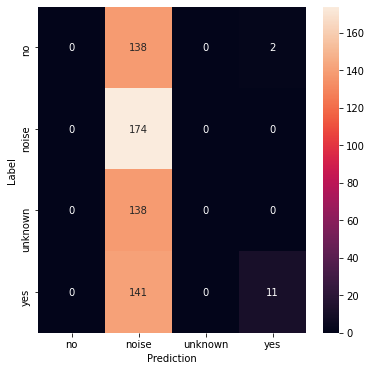

Epoch 2/25
77/77 [==============================] - 2s 32ms/step - loss: 0.6410 - accuracy: 0.7582 - val_loss: 2.9356 - val_accuracy: 0.3262
Epoch 3/25
77/77 [==============================] - 2s 32ms/step - loss: 0.4719 - accuracy: 0.8284 - val_loss: 2.9146 - val_accuracy: 0.3940
Validation set accuracy: 39%


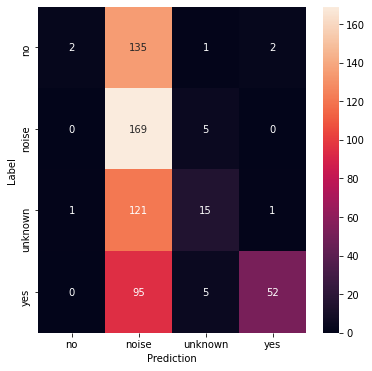

Epoch 4/25
77/77 [==============================] - 2s 32ms/step - loss: 0.3896 - accuracy: 0.8644 - val_loss: 2.5073 - val_accuracy: 0.4669
Epoch 5/25
77/77 [==============================] - 2s 32ms/step - loss: 0.3140 - accuracy: 0.8881 - val_loss: 1.7096 - val_accuracy: 0.5629
Validation set accuracy: 56%


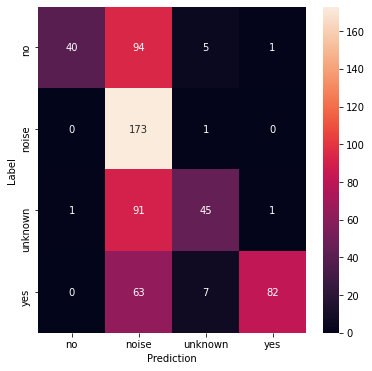

Epoch 6/25
77/77 [==============================] - 2s 32ms/step - loss: 0.2751 - accuracy: 0.9024 - val_loss: 1.0460 - val_accuracy: 0.6871
Epoch 7/25
77/77 [==============================] - 2s 32ms/step - loss: 0.2458 - accuracy: 0.9180 - val_loss: 0.2751 - val_accuracy: 0.9040
Validation set accuracy: 90%


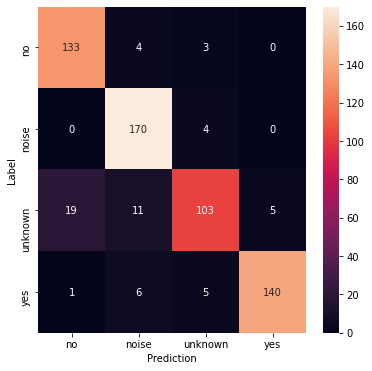

Epoch 8/25
77/77 [==============================] - 2s 32ms/step - loss: 0.2235 - accuracy: 0.9235 - val_loss: 0.3128 - val_accuracy: 0.8841
Epoch 9/25
77/77 [==============================] - 2s 32ms/step - loss: 0.1944 - accuracy: 0.9319 - val_loss: 0.2265 - val_accuracy: 0.9172
Validation set accuracy: 92%


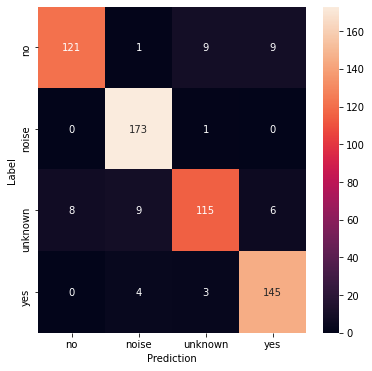

Epoch 10/25
77/77 [==============================] - 2s 32ms/step - loss: 0.1579 - accuracy: 0.9472 - val_loss: 0.2189 - val_accuracy: 0.9288
Epoch 11/25
77/77 [==============================] - 2s 32ms/step - loss: 0.1524 - accuracy: 0.9497 - val_loss: 0.2217 - val_accuracy: 0.9222
Validation set accuracy: 92%


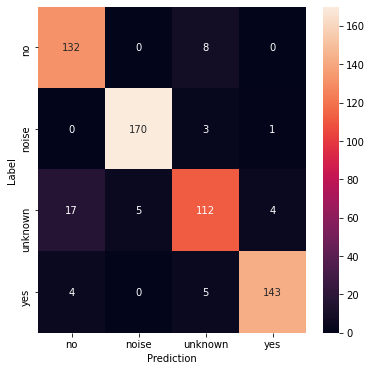

Epoch 12/25
77/77 [==============================] - 3s 33ms/step - loss: 0.1322 - accuracy: 0.9542 - val_loss: 0.2314 - val_accuracy: 0.9139
Epoch 13/25
77/77 [==============================] - 3s 33ms/step - loss: 0.1087 - accuracy: 0.9664 - val_loss: 0.1954 - val_accuracy: 0.9387
Validation set accuracy: 94%


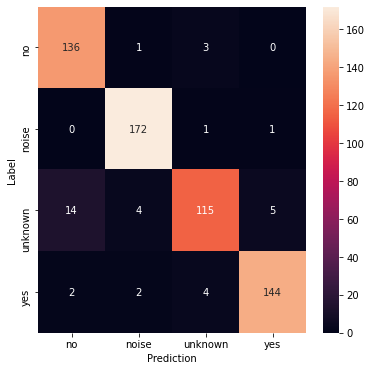

Epoch 14/25
77/77 [==============================] - 3s 33ms/step - loss: 0.0962 - accuracy: 0.9675 - val_loss: 0.1876 - val_accuracy: 0.9272
Epoch 15/25
77/77 [==============================] - 2s 32ms/step - loss: 0.0786 - accuracy: 0.9744 - val_loss: 0.2001 - val_accuracy: 0.9371
Validation set accuracy: 94%


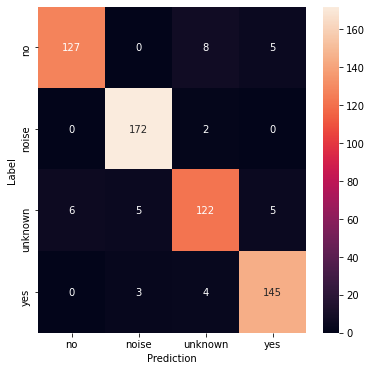

Epoch 16/25
77/77 [==============================] - 3s 33ms/step - loss: 0.0824 - accuracy: 0.9726 - val_loss: 0.1811 - val_accuracy: 0.9371
Epoch 17/25
77/77 [==============================] - 3s 33ms/step - loss: 0.0641 - accuracy: 0.9802 - val_loss: 0.2140 - val_accuracy: 0.9305
Validation set accuracy: 93%


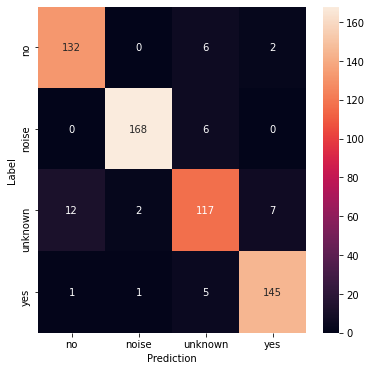

Epoch 18/25
77/77 [==============================] - 3s 33ms/step - loss: 0.0563 - accuracy: 0.9816 - val_loss: 0.2070 - val_accuracy: 0.9321
Epoch 19/25
77/77 [==============================] - 3s 33ms/step - loss: 0.0525 - accuracy: 0.9838 - val_loss: 0.2109 - val_accuracy: 0.9272
Validation set accuracy: 93%


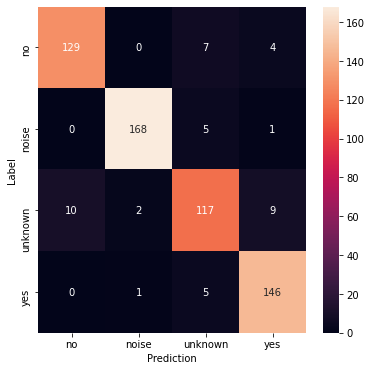

Epoch 20/25
77/77 [==============================] - 3s 33ms/step - loss: 0.0378 - accuracy: 0.9894 - val_loss: 0.2072 - val_accuracy: 0.9272
Epoch 21/25
77/77 [==============================] - 3s 33ms/step - loss: 0.0382 - accuracy: 0.9906 - val_loss: 0.2061 - val_accuracy: 0.9354
Validation set accuracy: 94%


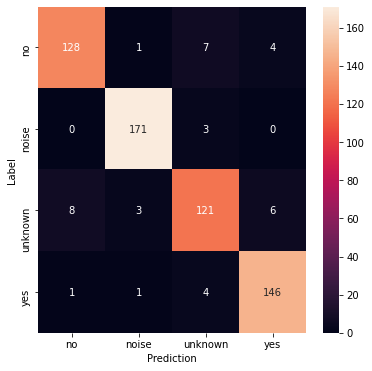

In [181]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(beta_1 = .6),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

EPOCHS = 25
history = model.fit( 
    train_d, 
    validation_data=val_d,  
    epochs=EPOCHS,
    callbacks = callbacks_list
)

Test set accuracy: 96%


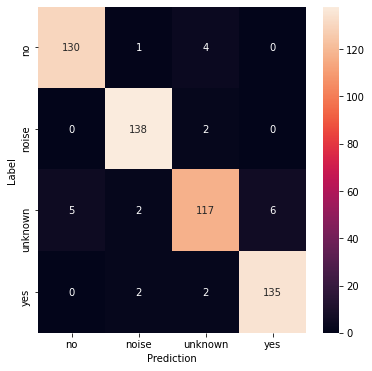

In [182]:
y_true, y_pred = testing(model)
conf_matr(y_true, y_pred)

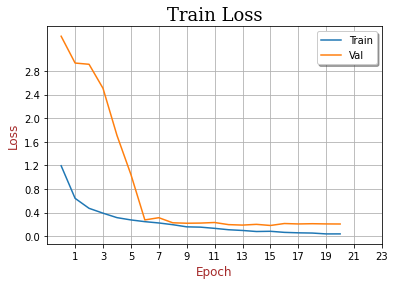

In [191]:
plt.plot(history.history['loss'], label = 'Train')
plt.plot(history.history['val_loss'], label = 'Val')
plt.title('Train Loss', family = 'serif', fontsize = 18)
plt.ylabel('Loss', color = 'brown', fontsize = 12) 
plt.xlabel('Epoch', color = 'brown', fontsize = 12)
plt.legend(frameon = True, shadow = True)
plt.yticks(np.arange(0,3.2,0.4))
plt.xticks(np.arange(1,25,2))
plt.grid()

In [193]:
def model_save(name, model = model):
  #model.save('/content/drive/MyDrive/PodCastle/custom_model.h5')
  model_json = model.to_json()
  with open("/content/drive/MyDrive/PodCastle/" + name + '.json', "w") as json_file:
      json_file.write(model_json)
  # serialize weights to HDF5
  model.save_weights("/content/drive/MyDrive/PodCastle/" + name + '.h5')
  print("Saved model to disk")

model_save('96%_custom_model')

Saved model to disk


In [198]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

## Deploy

In [248]:
train_files, validation_files = split(np.array(audios), test_size = .02, random_state = 42)
len(train_files), len(validation_files)

(5915, 121)

In [43]:
train = preprocess_dataset(train_files)
validation = preprocess_dataset(validation_files)

In [250]:
val_audio = []
val_labels = []
from tqdm import tqdm
for audio, label in tqdm(validation):
  val_audio.append(audio.numpy())
  val_labels.append(label.numpy())

val_audio = np.array(val_audio)
val_labels = np.array(val_labels)

100%|██████████| 121/121 [00:00<00:00, 253.22it/s]


In [251]:
batch_size = 64
#train = train.shuffle(1024, reshuffle_each_iteration=True)
train = train.batch(batch_size)
#train = train.repeat()
validation = validation.batch(batch_size)

train = train.cache().prefetch(AUTOTUNE)
validation = validation.cache().prefetch(AUTOTUNE)

In [258]:
# load json and create model
from keras.models import model_from_json
json_file = open('/content/drive/MyDrive/PodCastle/96%_custom_model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("/content/drive/MyDrive/PodCastle/96%_custom_model.h5")
print("Loaded model from disk")

Loaded model from disk


In [259]:
update_log()
#model.load_weights("/content/drive/MyDrive/PodCastle/96%_custom_model.h5")
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint( 
    filepath = '/content/drive/MyDrive/PodCastle/Downsampling-model-production-GPU_weights.hdf5',
    save_best_only = True,
    mode = 'auto'
)
early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', patience=  5, verbose=0, # min_delta=0.005
    restore_best_weights= True
)
display_callback = DisplayCallback(loaded_model, 2)
callbacks_list = [lr_scheduler_callback, tensorboard_callback, early_stopping_callback, checkpoint_callback, display_callback]
print(log_dir)

logs/fit/Downsampling-model-GPU_1623715158.763983


Epoch 1/25
93/93 [==============================] - 6s 44ms/step - loss: 1.3789 - accuracy: 0.5451 - val_loss: 2.5771 - val_accuracy: 0.3058
Validation set accuracy: 31%


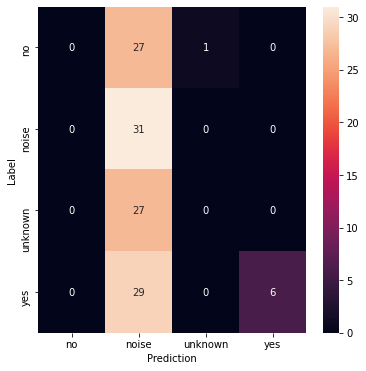

Epoch 2/25
93/93 [==============================] - 3s 32ms/step - loss: 0.6021 - accuracy: 0.7656 - val_loss: 2.7817 - val_accuracy: 0.3306
Epoch 3/25
93/93 [==============================] - 3s 31ms/step - loss: 0.4626 - accuracy: 0.8349 - val_loss: 2.8497 - val_accuracy: 0.4132
Validation set accuracy: 41%


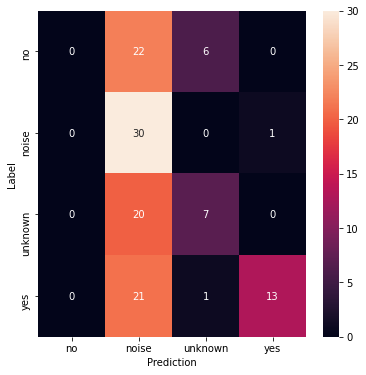

Epoch 4/25
93/93 [==============================] - 3s 31ms/step - loss: 0.3685 - accuracy: 0.8699 - val_loss: 1.1982 - val_accuracy: 0.6612
Epoch 5/25
93/93 [==============================] - 3s 31ms/step - loss: 0.3042 - accuracy: 0.8952 - val_loss: 1.0726 - val_accuracy: 0.6364
Validation set accuracy: 64%


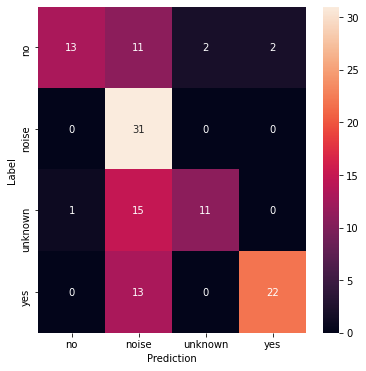

Epoch 6/25
93/93 [==============================] - 3s 31ms/step - loss: 0.2697 - accuracy: 0.9100 - val_loss: 0.4665 - val_accuracy: 0.8760
Epoch 7/25
93/93 [==============================] - 3s 31ms/step - loss: 0.2345 - accuracy: 0.9158 - val_loss: 0.3780 - val_accuracy: 0.8678
Validation set accuracy: 87%


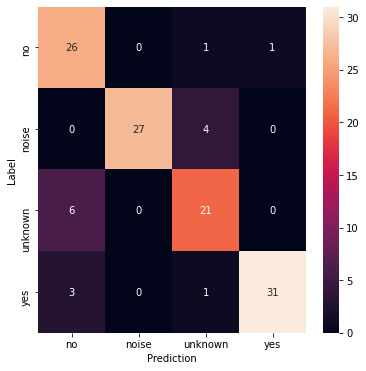

Epoch 8/25
93/93 [==============================] - 3s 31ms/step - loss: 0.2434 - accuracy: 0.9169 - val_loss: 0.2715 - val_accuracy: 0.9174
Epoch 9/25
93/93 [==============================] - 3s 31ms/step - loss: 0.2088 - accuracy: 0.9230 - val_loss: 0.4749 - val_accuracy: 0.8843
Validation set accuracy: 88%


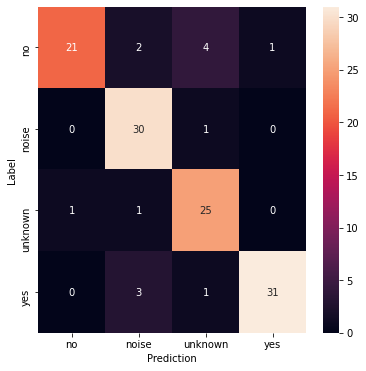

Epoch 10/25
93/93 [==============================] - 3s 31ms/step - loss: 0.1726 - accuracy: 0.9370 - val_loss: 0.2569 - val_accuracy: 0.9091
Epoch 11/25
93/93 [==============================] - 3s 31ms/step - loss: 0.1669 - accuracy: 0.9367 - val_loss: 0.3688 - val_accuracy: 0.8595
Validation set accuracy: 86%


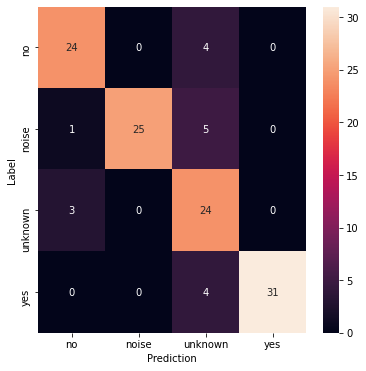

Epoch 12/25
93/93 [==============================] - 3s 32ms/step - loss: 0.1458 - accuracy: 0.9515 - val_loss: 0.2398 - val_accuracy: 0.9339
Epoch 13/25
93/93 [==============================] - 3s 32ms/step - loss: 0.1294 - accuracy: 0.9570 - val_loss: 0.3472 - val_accuracy: 0.9091
Validation set accuracy: 91%


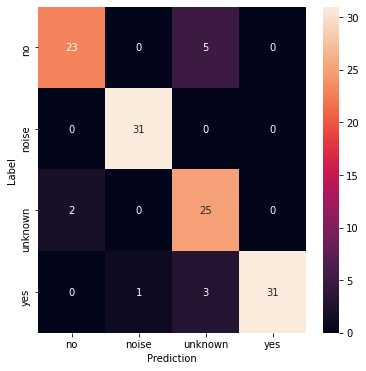

Epoch 14/25
93/93 [==============================] - 3s 31ms/step - loss: 0.1142 - accuracy: 0.9627 - val_loss: 0.2285 - val_accuracy: 0.9421
Epoch 15/25
93/93 [==============================] - 3s 32ms/step - loss: 0.1071 - accuracy: 0.9620 - val_loss: 0.2152 - val_accuracy: 0.9504
Validation set accuracy: 95%


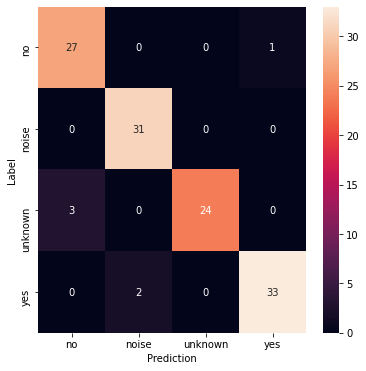

Epoch 16/25
93/93 [==============================] - 3s 31ms/step - loss: 0.0934 - accuracy: 0.9640 - val_loss: 0.2038 - val_accuracy: 0.9421
Epoch 17/25
93/93 [==============================] - 3s 31ms/step - loss: 0.0837 - accuracy: 0.9700 - val_loss: 0.2183 - val_accuracy: 0.9256
Validation set accuracy: 93%


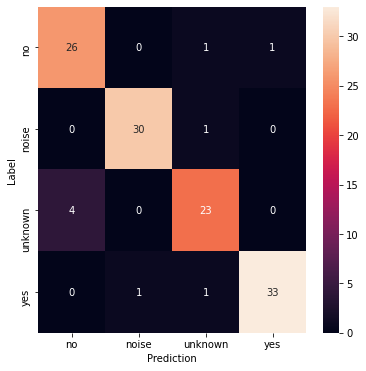

Epoch 18/25
93/93 [==============================] - 3s 32ms/step - loss: 0.0768 - accuracy: 0.9717 - val_loss: 0.2161 - val_accuracy: 0.9504
Epoch 19/25
93/93 [==============================] - 3s 32ms/step - loss: 0.0652 - accuracy: 0.9788 - val_loss: 0.2062 - val_accuracy: 0.9339
Validation set accuracy: 93%


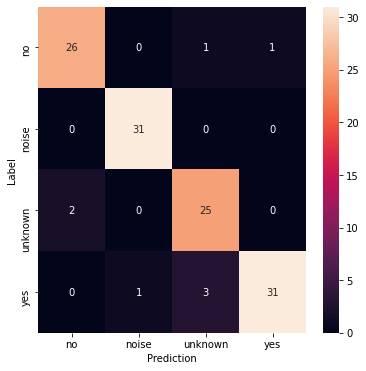

Epoch 20/25
93/93 [==============================] - 3s 32ms/step - loss: 0.0560 - accuracy: 0.9823 - val_loss: 0.2058 - val_accuracy: 0.9256


In [260]:
loaded_model.compile(
    optimizer=tf.keras.optimizers.Adam(beta_1 = .6),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

EPOCHS = 25
history_final = loaded_model.fit( 
    train #val_ds.batch(batch_size) 
    ,validation_data=validation,  
    epochs=EPOCHS,
    callbacks = callbacks_list,
    #steps_per_epoch = len(train_files) // batch_size
)

In [261]:
model_save('production')

Saved model to disk


## Understanding the network (saliency map)

In [149]:
# load json and create model
from keras.models import model_from_json
json_file = open('/content/drive/MyDrive/PodCastle/production.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("/content/drive/MyDrive/PodCastle/production.h5")
print("Loaded model from disk")

Loaded model from disk


log spec shape: (129, 124)


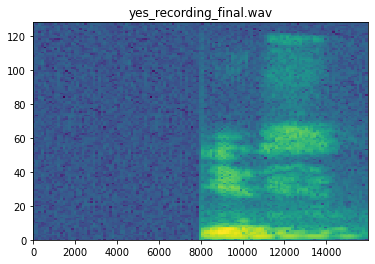

In [86]:
sample = '/content/drive/MyDrive/PodCastle/yes_recording_final.wav'
waveform, rate = librosa.load(sample, 16000)
label = get_label(sample + '/d')
spec = get_spectrogram(tf.convert_to_tensor(waveform))
plot_spectrogram(spec.numpy(), plt)
plt.title(label.numpy().decode('utf-8'));

In [177]:
expected_output = tf.convert_to_tensor(np.array([[0,0,0,1]]))
specto = tf.expand_dims(spec, 0)
specto = tf.expand_dims(specto, -1)
print(tf.shape(specto))
#tf.expand_dims(inputs, -1)
with tf.GradientTape() as tape:
    inputs = tf.cast(specto, tf.float32)
    tape.watch(inputs) # watch the input pixels
    predictions = model(inputs)
    loss = tf.keras.losses.categorical_crossentropy(expected_output, predictions)

gradients = tape.gradient(loss, inputs)

tf.Tensor([  1 129 124   1], shape=(4,), dtype=int32)


In [178]:
# reduce the RGB image to grayscale
grayscale_tensor = tf.reduce_sum(tf.abs(gradients), axis=-1)

normalized_tensor = tf.cast(
    255 * (grayscale_tensor - tf.reduce_min(grayscale_tensor))
    / (tf.reduce_max(grayscale_tensor) - tf.reduce_min(grayscale_tensor)),
    tf.uint8,
)

normalized_tensor = tf.squeeze(normalized_tensor)


In [179]:
# max and min value in the grayscale tensor
print(np.max(grayscale_tensor[0]))
print(np.min(grayscale_tensor[0]))
print()

# coordinates of the first pixel where the max and min values are located
max_pixel = np.unravel_index(np.argmax(grayscale_tensor[0]), grayscale_tensor[0].shape)
min_pixel = np.unravel_index(np.argmin(grayscale_tensor[0]), grayscale_tensor[0].shape)
print(max_pixel)
print(min_pixel)
print()

# these coordinates should have the max (255) and min (0) value in the normalized tensor
print(normalized_tensor[max_pixel])
print(normalized_tensor[min_pixel])

0.4770586
0.0

(38, 44)
(0, 0)

tf.Tensor(255, shape=(), dtype=uint8)
tf.Tensor(0, shape=(), dtype=uint8)


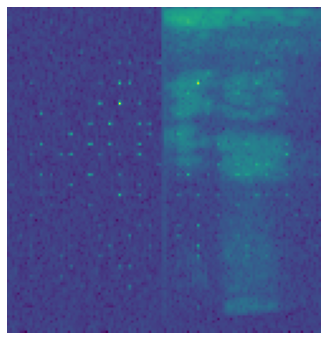

In [231]:
import cv2
image = tf.expand_dims(tf.math.log(spec), -1).numpy()
image = np.asarray(image, np.float64)
super_imposed = cv2.addWeighted(image.reshape((129, 124, 1)), .5, np.expand_dims(normalized_tensor.numpy()/255.0, -1), 10, 0.3)

plt.figure(figsize=(6,6))
plt.imshow(super_imposed, cmap = 'viridis')
plt.axis('off')
plt.show()

# Other Data Preprocessing Techniques

In [79]:
from sklearn.model_selection import train_test_split as split 
train_files, val_files = split(np.array(audios), test_size = .1, random_state = 42)
train_files, test_files = split(train_files, test_size = .1, random_state = 42)
len(train_files), len(val_files), len(test_files), len(audios)

(4888, 604, 544, 6036)

In [80]:
def mfccs_pipe(audio_path):
  wav, label = get_waveform_and_label(audio_path)

  stfts = tf.signal.stft(wav, 
                         frame_length=256, 
                         frame_step=128,
                         fft_length=256
                         )
  
  spectrograms = tf.abs(stfts)

  # Warp the linear scale spectrograms into the mel-scale.
  num_spectrogram_bins = stfts.shape[-1]
  lower_edge_hertz, upper_edge_hertz, num_mel_bins = 80.0, 7600.0, 80

  linear_to_mel_weight_matrix = tf.signal.linear_to_mel_weight_matrix(
    num_mel_bins, 
    num_spectrogram_bins,
    16000, 
    lower_edge_hertz,
    upper_edge_hertz
    )
  

  #spectrograms = tf.square(spectrograms)  # power spectrogram
  mel_spectrograms = tf.tensordot(spectrograms, linear_to_mel_weight_matrix, 1)
  # tf.matmul(tf.square(magnitude_spectrograms), linear_to_mel_weight_matrix)

  mel_spectrograms.set_shape(spectrograms.shape[:-1].concatenate(linear_to_mel_weight_matrix.shape[-1:]))
  log_mel_spectrograms = tf.math.log(mel_spectrograms + 1e-6)
  mfccs = tf.signal.mfccs_from_log_mel_spectrograms(log_mel_spectrograms)[..., :13] # 13rd order

  mfccs = tf.expand_dims(mfccs, -1)
  label_id = tf.argmax(label == labels)  # encode the label
  return mfccs, label_id

In [81]:
AUTOTUNE = tf.data.AUTOTUNE
files_ds = tf.data.Dataset.from_tensor_slices(train_files)
train_ds = files_ds.map(mfccs_pipe, num_parallel_calls = AUTOTUNE)

(124, 13, 1)


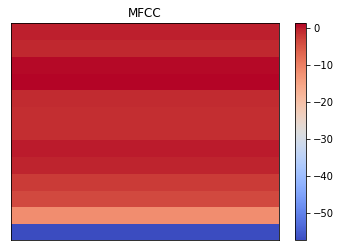

In [82]:
for mfccs,y in train_ds.take(1):
  print(mfccs.shape)
  fig, ax = plt.subplots()
  img = Display.specshow(mfccs.numpy()[0], ax=ax)
  fig.colorbar(img, ax=ax)
  ax.set(title='MFCC')

In [83]:
files_val = tf.data.Dataset.from_tensor_slices(val_files)
val_ds = files_val.map(mfccs_pipe, num_parallel_calls = AUTOTUNE)
files_test = tf.data.Dataset.from_tensor_slices(test_files)
test_ds = files_test.map(mfccs_pipe, num_parallel_calls = AUTOTUNE)

In [85]:
val_audio = []
val_labels = []
for audio, label in tqdm(val_ds):
  val_audio.append(audio.numpy())
  val_labels.append(label.numpy())

val_audio = np.array(val_audio)
val_labels = np.array(val_labels)

test_audio = []
test_labels = []
for audio, label in tqdm(test_ds):
  test_audio.append(audio.numpy())
  test_labels.append(label.numpy())

test_audio = np.array(test_audio)
test_labels = np.array(test_labels)

100%|██████████| 544/544 [02:22<00:00,  3.83it/s]


In [19]:
labels = ['no' , 'noise', 'unknown', 'yes']
batch_size = 64
train_d = train_ds.batch(batch_size)
val_d = val_ds.batch(batch_size)
train_d = train_d.cache().prefetch(AUTOTUNE)
val_d = val_d.cache().prefetch(AUTOTUNE)

In [144]:
from tensorflow.keras.layers import Dense, Conv2D, GlobalAveragePooling2D, MaxPooling2D, BatchNormalization, Dropout, Flatten, ReLU, Lambda, UpSampling2D, Conv2DTranspose
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape = [124, 13, 1]) ,                             
    tf.keras.layers.experimental.preprocessing.Resizing(32, 32) ,
    #Conv2D(32, 5, strides = 2, input_shape = input_shape),
    Lambda(lambda x: tf.abs(x)),
    BatchNormalization(),
    MaxPooling2D(),
    Conv2D(64, (3,3), activation='selu'),
    Conv2D(64, (3,3), activation = 'selu'),
    Conv2D(64, (3,3)),
    BatchNormalization(),
    ReLU(),
    MaxPooling2D(),
    Dropout(0.35),
    Flatten(),
    Dense(256, 'tanh'),
    Dropout(0.4),
    Dense(4, 'softmax'),
])

model.summary()

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resizing_4 (Resizing)        (None, 32, 32, 1)         0         
_________________________________________________________________
lambda_18 (Lambda)           (None, 32, 32, 1)         0         
_________________________________________________________________
batch_normalization_36 (Batc (None, 32, 32, 1)         4         
_________________________________________________________________
max_pooling2d_36 (MaxPooling (None, 16, 16, 1)         0         
_________________________________________________________________
conv2d_62 (Conv2D)           (None, 14, 14, 64)        640       
_________________________________________________________________
conv2d_63 (Conv2D)           (None, 12, 12, 64)        36928     
_________________________________________________________________
conv2d_64 (Conv2D)           (None, 10, 10, 64)      

Epoch 1/25
77/77 [==============================] - 2s 13ms/step - loss: 0.2004 - accuracy: 0.9280 - val_loss: 0.3499 - val_accuracy: 0.8692
Validation set accuracy: 87%


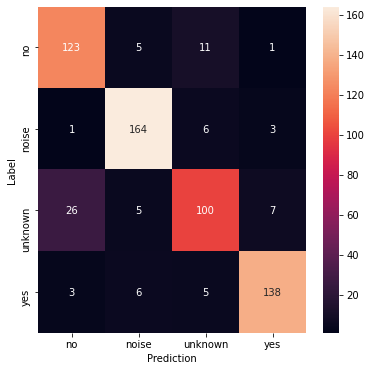

Epoch 2/25
77/77 [==============================] - 1s 10ms/step - loss: 0.2003 - accuracy: 0.9286 - val_loss: 0.3417 - val_accuracy: 0.8709
Epoch 3/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1920 - accuracy: 0.9294 - val_loss: 0.3395 - val_accuracy: 0.8742
Validation set accuracy: 87%


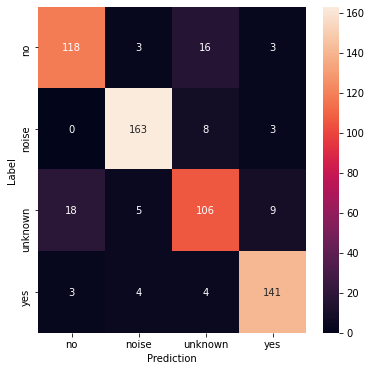

Epoch 4/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1835 - accuracy: 0.9311 - val_loss: 0.4094 - val_accuracy: 0.8543
Epoch 5/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1935 - accuracy: 0.9251 - val_loss: 0.3429 - val_accuracy: 0.8742
Validation set accuracy: 87%


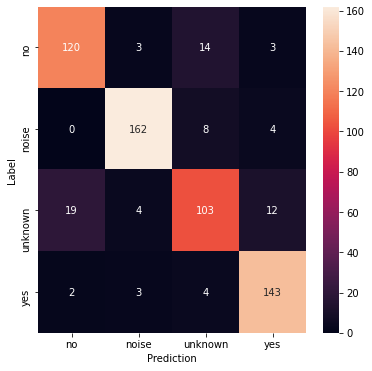

Epoch 6/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1874 - accuracy: 0.9319 - val_loss: 0.3524 - val_accuracy: 0.8742
Epoch 7/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1845 - accuracy: 0.9292 - val_loss: 0.3376 - val_accuracy: 0.8775
Validation set accuracy: 88%


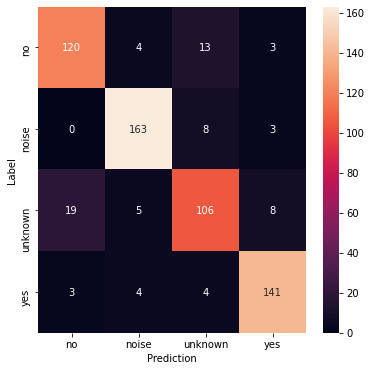

Epoch 8/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1762 - accuracy: 0.9333 - val_loss: 0.3626 - val_accuracy: 0.8675
Epoch 9/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1821 - accuracy: 0.9278 - val_loss: 0.3427 - val_accuracy: 0.8758
Validation set accuracy: 88%


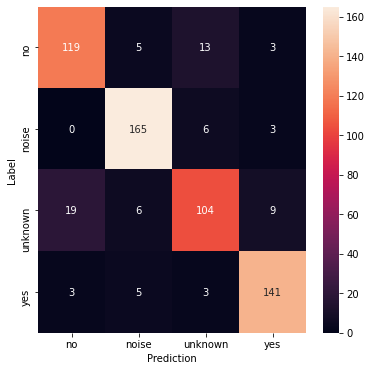

Epoch 10/25
77/77 [==============================] - 1s 11ms/step - loss: 0.1748 - accuracy: 0.9302 - val_loss: 0.4012 - val_accuracy: 0.8742
Epoch 11/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1795 - accuracy: 0.9370 - val_loss: 0.3472 - val_accuracy: 0.8725
Validation set accuracy: 87%


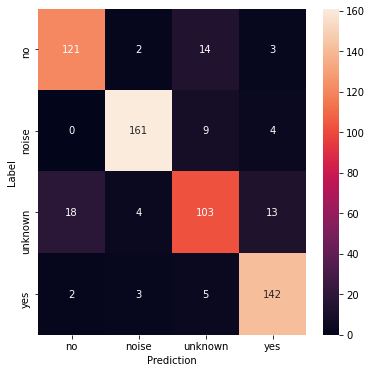

Epoch 12/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1719 - accuracy: 0.9376 - val_loss: 0.3416 - val_accuracy: 0.8758
Epoch 13/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1778 - accuracy: 0.9337 - val_loss: 0.3492 - val_accuracy: 0.8825
Validation set accuracy: 88%


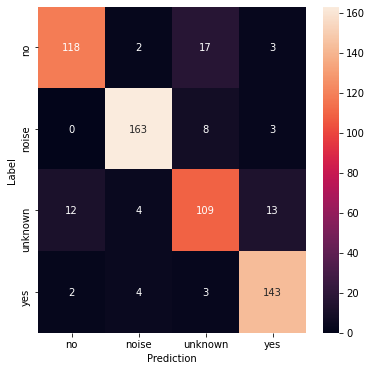

Epoch 14/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1590 - accuracy: 0.9415 - val_loss: 0.3483 - val_accuracy: 0.8808
Epoch 15/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1712 - accuracy: 0.9388 - val_loss: 0.3435 - val_accuracy: 0.8808
Validation set accuracy: 88%


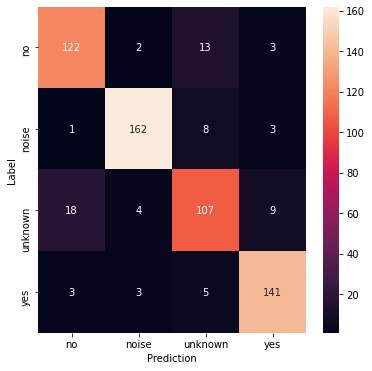

Epoch 16/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1587 - accuracy: 0.9419 - val_loss: 0.3512 - val_accuracy: 0.8808
Epoch 17/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1617 - accuracy: 0.9427 - val_loss: 0.3507 - val_accuracy: 0.8758
Validation set accuracy: 88%


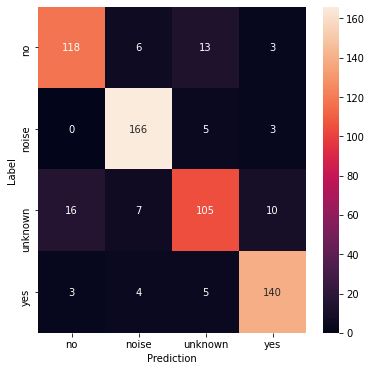

Epoch 18/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1708 - accuracy: 0.9354 - val_loss: 0.3509 - val_accuracy: 0.8791
Epoch 19/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1577 - accuracy: 0.9427 - val_loss: 0.3555 - val_accuracy: 0.8825
Validation set accuracy: 88%


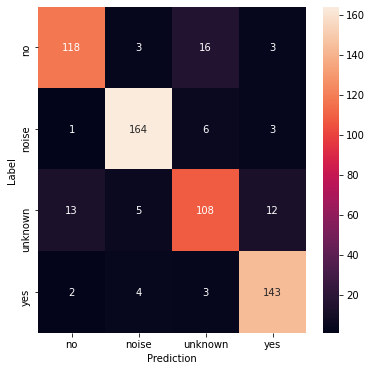

Epoch 20/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1625 - accuracy: 0.9411 - val_loss: 0.3507 - val_accuracy: 0.8791
Epoch 21/25
77/77 [==============================] - 1s 11ms/step - loss: 0.1729 - accuracy: 0.9374 - val_loss: 0.3807 - val_accuracy: 0.8758
Validation set accuracy: 88%


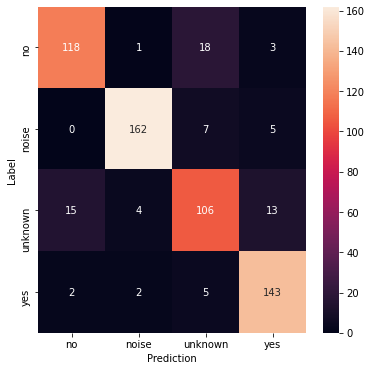

Epoch 22/25
77/77 [==============================] - 1s 11ms/step - loss: 0.1587 - accuracy: 0.9403 - val_loss: 0.3518 - val_accuracy: 0.8791
Epoch 23/25
77/77 [==============================] - 1s 11ms/step - loss: 0.1579 - accuracy: 0.9425 - val_loss: 0.3585 - val_accuracy: 0.8775
Validation set accuracy: 88%


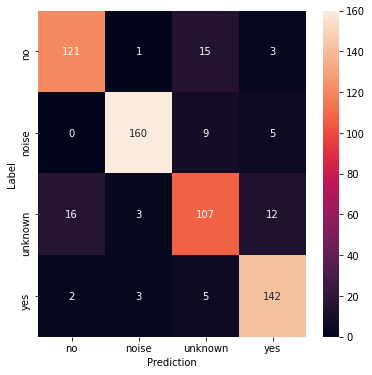

Epoch 24/25
77/77 [==============================] - 1s 10ms/step - loss: 0.1628 - accuracy: 0.9374 - val_loss: 0.3492 - val_accuracy: 0.8791
Epoch 25/25
77/77 [==============================] - 1s 11ms/step - loss: 0.1596 - accuracy: 0.9456 - val_loss: 0.3519 - val_accuracy: 0.8858
Validation set accuracy: 89%


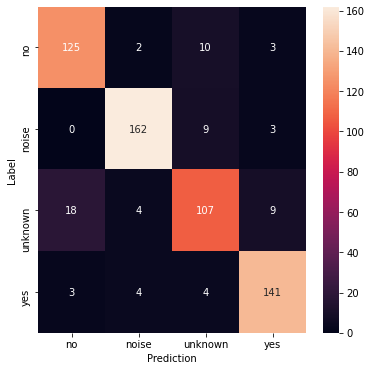

In [146]:
display = DisplayCallback(model, 2)
model.compile(
    optimizer=tf.keras.optimizers.SGD(),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

EPOCHS = 25
history = model.fit( 
    train_d, 
    validation_data=val_d,  
    epochs=EPOCHS,
    callbacks = [display]
)

Test set accuracy: 90%


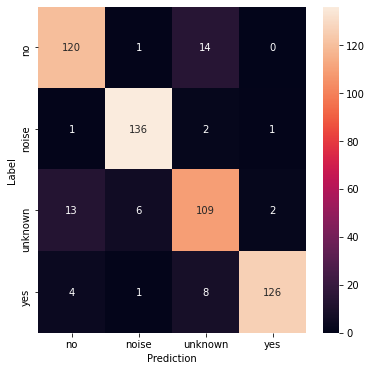

In [148]:
t, p = testing(model)
conf_matr(t, p)